In [1]:
from IPython.display import clear_output as clear
!pip install tensorflow-addons
clear()

In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 9681524858498957295
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 10063183872
locality {
  bus_id: 1
  links {
  }
}
incarnation: 348640158892463359
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3060, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


In [3]:
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from random import random

# Data
import tensorflow.image as tfi
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import concatenate
from keras.layers import ZeroPadding2D
from keras.layers import Conv2DTranspose
from tensorflow_addons.layers import InstanceNormalization

# Model Functions
from keras.models import Model
from keras.models import load_model
from keras.models import Sequential
from keras.initializers import RandomNormal

# Optimizers
from tensorflow.keras.optimizers import Adam

# Loss
from keras.losses import BinaryCrossentropy

# Model Viz
from tensorflow.keras.utils import plot_model

C:\Users\IT\anaconda3\envs\gpu\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\IT\anaconda3\envs\gpu\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to 

In [4]:
def show_image(image, title=None):
    '''
    The function takes in an image and plots it using Matplotlib.
    '''
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [5]:
root_horse_path = r'C:\Users\IT\midas\monet2photo\monet2photo\trainA'
root_zebra_path = r'C:\Users\IT\midas\monet2photo\monet2photo\trainB'
horse_paths = sorted(glob(root_horse_path + '/*.jpg'))[:958]
zebra_paths = sorted(glob(root_zebra_path + '/*.jpg'))[:958]

In [6]:
print(f'Number of horse images: {len(horse_paths)}')
print(f'Number of zebra images: {len(zebra_paths)}')

Number of horse images: 958
Number of zebra images: 958


In [7]:
SIZE = 256
horse_images, zebra_images = np.zeros(shape=(len(horse_paths),SIZE,SIZE,3)), np.zeros(shape=(len(horse_paths),SIZE,SIZE,3))
for i,(horse_path, zebra_path) in tqdm(enumerate(zip(horse_paths, zebra_paths)), desc='Loading'):
    
    horse_image = img_to_array(load_img(horse_path))
    horse_image = tfi.resize(tf.cast(horse_image, tf.float32)/255., (SIZE, SIZE))
    
    zebra_image = img_to_array(load_img(zebra_path))
    zebra_image = tfi.resize(tf.cast(zebra_image,tf.float32)/255., (SIZE, SIZE))
    
    # as the data is unpaired so we don't have to worry about, positioning the images.
    
    horse_images[i] = horse_image
    zebra_images[i] = zebra_image

Loading: 958it [00:06, 143.00it/s]


In [8]:
dataset = [horse_images, zebra_images]

In [9]:
def ResidualBlock(filters, layer, index):
#     init = RandomNormal(stddev=0.02)
    
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv1".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization1".format(index))(x)
    x = ReLU(name="Block_{}_ReLU".format(index))(x)
    
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv2".format(index))(x)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization2".format(index))(x)
    
    x = concatenate([x, layer], name="Block_{}_Merge".format(index))
    
    return x

In [10]:
def downsample(filters, layer, size=3, strides=2, activation=None, index=None, norm=True):
    x = Conv2D(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Encoder_{}_Conv".format(index))(layer)
    if norm:
        x = InstanceNormalization(axis=-1, name="Encoder_{}_Normalization".format(index))(x)
    if activation is not None:
        x = Activation(activation, name="Encoder_{}_Activation".format(index))(x)
    else:
        x = LeakyReLU( name="Encoder_{}_LeakyReLU".format(index))(x)
    return x

In [11]:
def upsample(filters, layer, size=3, strides=2, index=None):
    x = Conv2DTranspose(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Decoder_{}_ConvT".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Decoder_{}_Normalization".format(index))(x)
    x = ReLU( name="Encoder_{}_ReLU".format(index))(x)
    return x

In [12]:
def Generator(n_resnet=9, name="Generator"):
    
    inp_image = Input(shape=(SIZE, SIZE, 3), name="InputImage")         # 256 x 256 x3
    
    x = downsample(64, inp_image, size=7, strides=1, index=1)           # 256 x 256 x 64
    x = downsample(128, x, index=2)                                     # 128 x 128 x 128
    x = downsample(256, x, index=3)                                     # 64 x 64 x 256
    
    for i in range(n_resnet):
        x = ResidualBlock(256, x, index=i+4)                             # (64 x 64 x 256) x n_resnet
    
    x = upsample(128, x, index=13)                                       # 128 x 128 x 128
    x = upsample(64, x, index=14)                                        # 256 x 256 x 64
    x = downsample(3, x, size=7, strides=1, activation='tanh', index=15) # 256 x 256 x 3
    
    model = Model(
        inputs=inp_image,
        outputs=x,
        name=name
    )
    return model

In [13]:
def Discriminator(name='Discriminator'):
    init = RandomNormal(stddev=0.02)
    src_img = Input(shape=(SIZE, SIZE, 3), name="InputImage")     # 256 x 256 x 3
    x = downsample(64, src_img, size=4, strides=2, index=1, norm=False) # 128 x 128 x 64
    x = downsample(128, x, size=4, strides=2, index=2)            # 64 x 64 x 128
    x = downsample(256, x, size=4, strides=2, index=3)            # 32 x 32 x 256
    x = downsample(512, x, size=4, strides=2, index=4)            # 16 x 16 x 512
    x = downsample(512, x, size=4, strides=2, index=5)            # 8 x 8 x 512  # we can try out a different architecture with zero padding layer.
    patch_out = Conv2D(1, kernel_size=4, padding='same', kernel_initializer=init, use_bias=False)(x) # 8 x 8 x 1
    
    model = Model(
        inputs=src_img,
        outputs=patch_out,
        name=name
    )
    model.compile(
        loss='mse',
        optimizer=Adam(learning_rate=2e-4, beta_1=0.5),
        loss_weights=[0.5]
    )
    return model

In [14]:
def CombineModel(g_model1, g_model2, d_model, name):
    # train the Generator
    g_model1.trainable = True

    # Stop the Discriminator and 2nd Generator
    d_model.trainable = False
    g_model2.trainable = False
    
    # Adversarial Loss
    input_gen = Input(shape=(SIZE, SIZE, 3))
    gen_1_out = g_model1(input_gen)
    dis_out = d_model(gen_1_out)
    
    # Identity Loss
    input_id = Input(shape=(SIZE, SIZE, 3))
    output_id = g_model1(input_id)
    
    # Cycle Loss - Forward
    output_f = g_model2(gen_1_out)
    
    # Cycle Loss - Backward
    gen_2_out = g_model2(input_id)
    output_b = g_model1(gen_2_out)
    
    # Final Model 
    model = Model(
        inputs=[input_gen, input_id],
        outputs=[dis_out, output_id, output_f, output_b],
        name=name
    )
    model.compile(
        loss=['mse', 'mae', 'mae', 'mae'],
        loss_weights=[1,5,10,10],
        optimizer= Adam(learning_rate=2e-4, beta_1=0.5)
    )
    return model

In [15]:
def generate_real_samples(n_samples, dataset):
    ix = np.random.randint(0,dataset.shape[0], n_samples)
    X = dataset[ix]
    y = np.ones(shape=(n_samples, 8, 8, 1))
    return X, y

In [16]:
def generate_fake_samples(g_model, dataset):
    X = g_model.predict(dataset)
    y = np.zeros(shape=(len(dataset), 8, 8, 1))
    return X, y

In [17]:
def update_image_pool(pool, images, max_size=50):
    selected = list()
    for image in images:
        if len(pool) < max_size:
            pool.append(image)
            selected.append(image)
        elif random() < 0.5:
            selected.append(image)
        else:
            ix = np.random.randint(0,len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return np.asarray(selected)

In [18]:
def show_preds(g_AB, g_BA,n_images=1):
    for i in range(n_images):
        
        id = np.random.randint(len(horse_images))
        horse, zebra = horse_images[id], zebra_images[id]
        horse_pred, zebra_pred = g_BA.predict(tf.expand_dims(zebra,axis=0))[0], g_AB.predict(tf.expand_dims(horse,axis=0))[0]
        
        plt.figure(figsize=(10,8))
        
        plt.subplot(1,4,1)
        show_image(horse, title='Original Monet')
        
        plt.subplot(1,4,2)
        show_image(zebra_pred, title='Generated Photo')
        
        plt.subplot(1,4,3)
        show_image(zebra, title='Original Photo')
        
        plt.subplot(1,4,4)
        show_image(horse_pred, title='Genrated Monet')
        
        plt.tight_layout()
        plt.show()

In [19]:
def train(d_model_A, d_model_B, gen_AB, gen_BA, c_AB, c_BA, epochs=10, chunk=5):
    
    n_epochs, n_batch = epochs, 1
    
    trainA, trainB = dataset
    poolA, poolB = list(), list()
    
    # in simple words, we are going through the whole data.
    bat_per_epoch = int(len(trainA)/n_batch)
    n_steps = bat_per_epoch
    
    for j in tqdm(range(1, epochs + 1), desc="Epochs"):
        # Initialize accumulators for losses
        total_dA_loss_real = 0
        total_dA_loss_fake = 0
        total_dB_loss_real = 0
        total_dB_loss_fake = 0
        total_gen_loss1 = 0
        total_gen_loss2 = 0
        
        for i in range(n_steps):
            
            # Let's get some real data in hand.
            X_realA, y_realA = generate_real_samples(n_batch, trainA)
            X_realB, y_realB = generate_real_samples(n_batch, trainB)

            # use our generators to generate some fake data.
            X_fakeA, y_fakeA = generate_fake_samples(gen_BA, X_realB)
            X_fakeB, y_fakeB = generate_fake_samples(gen_AB, X_realA)
            
            # create a pool of images. You can also understand it like a replay buffer.
            X_fakeA = update_image_pool(poolA, X_fakeA)
            X_fakeB = update_image_pool(poolB, X_fakeB)
            
            # Let's finally train the gen 2 and get the losses.
            gen_loss2, _, _, _, _ = c_BA.train_on_batch(
                [X_realB, X_realA],
                [y_realB, X_realA, X_realB, X_realA]
            )
            
            # It's time for our discriminator to win our generator.
            dA_loss_real = d_model_A.train_on_batch(X_realA, y_realA)
            dA_loss_fake = d_model_A.train_on_batch(X_fakeA, y_fakeA)
            
            # one cycle is completed, let's move to second cycle.
            gen_loss1, _, _, _, _ = c_AB.train_on_batch(
                [X_realA, X_realB],
                [y_realA, X_realB, X_realA, X_realB]
            )
            
            # again, let's give some power to our discriminators.
            dB_loss_real = d_model_B.train_on_batch(X_realB, y_realB)
            dB_loss_fake = d_model_B.train_on_batch(X_fakeB, y_fakeB)
            
            # Accumulate losses
            total_dA_loss_real += dA_loss_real
            total_dA_loss_fake += dA_loss_fake
            total_dB_loss_real += dB_loss_real
            total_dB_loss_fake += dB_loss_fake
            total_gen_loss1 += gen_loss1
            total_gen_loss2 += gen_loss2

        # Calculate average losses for the epoch
        avg_dA_loss_real = total_dA_loss_real / n_steps
        avg_dA_loss_fake = total_dA_loss_fake / n_steps
        avg_dB_loss_real = total_dB_loss_real / n_steps
        avg_dB_loss_fake = total_dB_loss_fake / n_steps
        avg_gen_loss1 = total_gen_loss1 / n_steps
        avg_gen_loss2 = total_gen_loss2 / n_steps
        
        # Print average losses for the epoch
        print(f'Epoch {j}/{epochs}')
        print(f'dA_loss_real: {avg_dA_loss_real}, dA_loss_fake: {avg_dA_loss_fake}')
        print(f'dB_loss_real: {avg_dB_loss_real}, dB_loss_fake: {avg_dB_loss_fake}')
        print(f'gen_loss1: {avg_gen_loss1}, gen_loss2: {avg_gen_loss2}')

        if (j % chunk) == 0:
            show_preds(gen_AB, gen_BA, n_images=1)
        
        if j in [30,35]:
            gen_AB.save(f"GeneratorMtoP2_{j}.h5")
            gen_BA.save(f"GeneratorPtoM2_{j}.h5")


In [20]:
g_AB = Generator(name="GeneratorAB")
g_BA = Generator(name="GeneratorBA")

# here are the respective discriminators.
d_A = Discriminator(name="DiscriminatorA")
d_B = Discriminator(name="DiscriminatorB")

# finally, let's combine all of them.
c_AB = CombineModel(g_AB, g_BA, d_B, name="GanAB")
c_BA = CombineModel(g_BA, g_AB, d_A, name="GanBA")

Epochs:   0%|                                                                                   | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epochs:   2%|█▊                                                                    | 1/40 [31:18<20:21:08, 1878.68s/it]

Epoch 1/40
dA_loss_real: 0.1048547042932824, dA_loss_fake: 0.10216514458359727
dB_loss_real: 0.12583470647271902, dB_loss_fake: 0.1022978113900524
gen_loss1: 7.8075479746860355, gen_loss2: 8.154556040226293
1/1 [==============================] - 0s 21ms/step


Epochs:   5%|███▍                                                                | 2/40 [1:01:50<19:32:31, 1851.34s/it]

Epoch 2/40
dA_loss_real: 0.019493094663668446, dA_loss_fake: 0.019550064559999195
dB_loss_real: 0.01697015637370985, dB_loss_fake: 0.017307928901861787
gen_loss1: 5.611013509286471, gen_loss2: 5.8119879771871705
1/1 [==============================] - 0s 20ms/step


Epochs:   8%|█████                                                               | 3/40 [1:32:27<18:57:31, 1844.64s/it]

Epoch 3/40
dA_loss_real: 0.02248221573236132, dA_loss_fake: 0.01961489087532105
dB_loss_real: 0.03640810481179311, dB_loss_fake: 0.0385843030045087
gen_loss1: 4.8021742376753584, gen_loss2: 4.909754381548139
1/1 [==============================] - 0s 22ms/step


Epochs:  10%|██████▊                                                             | 4/40 [2:03:08<18:25:59, 1843.31s/it]

Epoch 4/40
dA_loss_real: 0.018850088965644503, dA_loss_fake: 0.014648251214310369
dB_loss_real: 0.0339229092205338, dB_loss_fake: 0.03302129601456015
gen_loss1: 4.319472544626303, gen_loss2: 4.5754804994467655
1/1 [==============================] - 0s 19ms/step
Epoch 5/40
dA_loss_real: 0.017091339306226815, dA_loss_fake: 0.012386677834631984
dB_loss_real: 0.005785215678276657, dB_loss_fake: 0.005495146545845824
gen_loss1: 3.937089395672394, gen_loss2: 4.094053855270832
1/1 [==============================] - 1s 658ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


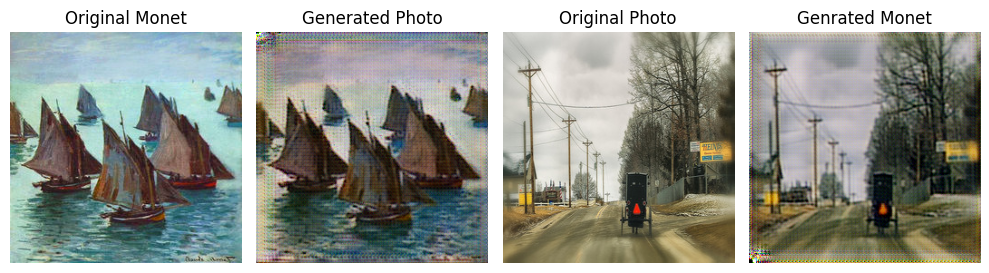

Epochs:  12%|████████▌                                                           | 5/40 [2:33:57<17:56:23, 1845.25s/it]

1/1 [==============================] - 0s 21ms/step


Epochs:  15%|██████████▏                                                         | 6/40 [3:04:51<17:27:15, 1848.09s/it]

Epoch 6/40
dA_loss_real: 0.00452349472103219, dA_loss_fake: 0.004486900812480599
dB_loss_real: 0.00907042892036402, dB_loss_fake: 0.008395670711878607
gen_loss1: 3.5835570522539304, gen_loss2: 3.7413063845704144
1/1 [==============================] - 0s 20ms/step


Epochs:  18%|███████████▉                                                        | 7/40 [3:35:50<16:58:27, 1851.73s/it]

Epoch 7/40
dA_loss_real: 0.013057248546502632, dA_loss_fake: 0.008049533831144647
dB_loss_real: 0.09252767892765724, dB_loss_fake: 0.092943513529341
gen_loss1: 3.2357197744861277, gen_loss2: 3.7107040837313785
1/1 [==============================] - 0s 21ms/step


Epochs:  20%|█████████████▌                                                      | 8/40 [4:06:55<16:29:54, 1856.08s/it]

Epoch 8/40
dA_loss_real: 0.010095117877589965, dA_loss_fake: 0.005923918524763347
dB_loss_real: 0.12675293729716372, dB_loss_fake: 0.11994443223753357
gen_loss1: 2.893839143387709, gen_loss2: 3.615313671327085
1/1 [==============================] - 0s 22ms/step


Epochs:  22%|███████████████▎                                                    | 9/40 [4:38:08<16:01:39, 1861.27s/it]

Epoch 9/40
dA_loss_real: 0.007547747219768343, dA_loss_fake: 0.0022023725550467904
dB_loss_real: 0.10851771528064613, dB_loss_fake: 0.09186689262443644
gen_loss1: 2.909453359924428, gen_loss2: 3.551886142295686
1/1 [==============================] - 0s 22ms/step
Epoch 10/40
dA_loss_real: 0.008217075069807457, dA_loss_fake: 0.0024421736972749433
dB_loss_real: 0.10022409367063986, dB_loss_fake: 0.07759289228428341
gen_loss1: 2.9185801714596518, gen_loss2: 3.477770932780925
1/1 [==============================] - 0s 22ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


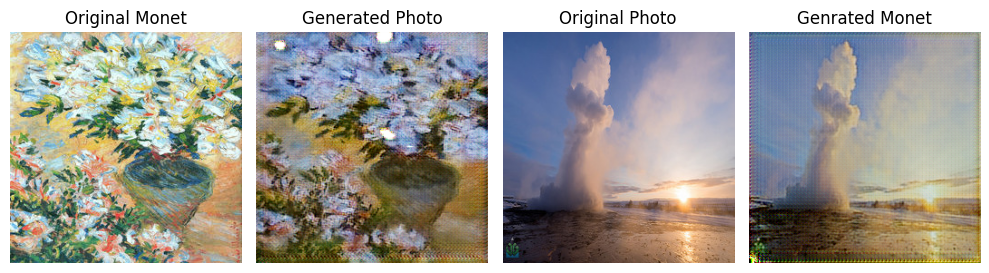

Epochs:  25%|████████████████▊                                                  | 10/40 [5:09:29<15:33:45, 1867.51s/it]

1/1 [==============================] - 0s 25ms/step


Epochs:  28%|██████████████████▍                                                | 11/40 [5:40:59<15:05:57, 1874.40s/it]

Epoch 11/40
dA_loss_real: 0.08879792154790923, dA_loss_fake: 0.08942778066602936
dB_loss_real: 0.08865228119390843, dB_loss_fake: 0.06918986979458823
gen_loss1: 3.238161061029096, gen_loss2: 3.418667871046166
1/1 [==============================] - 0s 23ms/step


Epochs:  30%|████████████████████                                               | 12/40 [6:12:41<14:38:31, 1882.54s/it]

Epoch 12/40
dA_loss_real: 0.11865180269095635, dA_loss_fake: 0.11408786499767812
dB_loss_real: 0.08930286288500563, dB_loss_fake: 0.06818015413142017
gen_loss1: 3.1513124395760714, gen_loss2: 3.1570883290006124
1/1 [==============================] - 0s 23ms/step


Epochs:  32%|█████████████████████▊                                             | 13/40 [6:44:32<14:11:01, 1891.17s/it]

Epoch 13/40
dA_loss_real: 0.10855640662349916, dA_loss_fake: 0.10684867309394734
dB_loss_real: 0.09077267637605135, dB_loss_fake: 0.07308141256868256
gen_loss1: 3.012652624499574, gen_loss2: 3.0265859326888225
1/1 [==============================] - 0s 26ms/step


Epochs:  35%|███████████████████████▍                                           | 14/40 [7:16:32<13:43:17, 1899.92s/it]

Epoch 14/40
dA_loss_real: 0.09491428130355883, dA_loss_fake: 0.09775363992717864
dB_loss_real: 0.08340405140923714, dB_loss_fake: 0.06870980543037779
gen_loss1: 3.062828103908666, gen_loss2: 3.05913990051612
1/1 [==============================] - 0s 23ms/step
Epoch 15/40
dA_loss_real: 0.08451158915124328, dA_loss_fake: 0.08611262667368094
dB_loss_real: 0.08513831001651008, dB_loss_fake: 0.06516843526755384
gen_loss1: 3.0522152005008465, gen_loss2: 3.0784660815446014
1/1 [==============================] - 0s 24ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


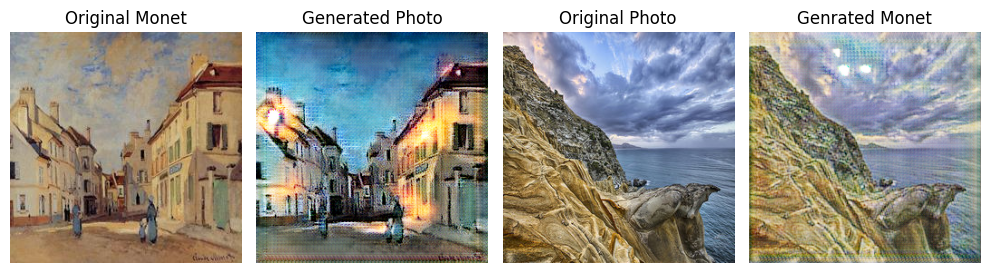

Epochs:  38%|█████████████████████████▏                                         | 15/40 [7:48:39<13:15:06, 1908.28s/it]

1/1 [==============================] - 0s 27ms/step


Epochs:  40%|██████████████████████████▊                                        | 16/40 [8:20:57<12:46:49, 1917.07s/it]

Epoch 16/40
dA_loss_real: 0.07035557485267224, dA_loss_fake: 0.07044659764117062
dB_loss_real: 0.08049279874852239, dB_loss_fake: 0.06415214427986954
gen_loss1: 3.0326144335663145, gen_loss2: 3.1622765987551538
1/1 [==============================] - 0s 26ms/step


Epochs:  42%|████████████████████████████▍                                      | 17/40 [8:53:25<12:18:24, 1926.29s/it]

Epoch 17/40
dA_loss_real: 0.07049475249344393, dA_loss_fake: 0.06799974824333008
dB_loss_real: 0.0807111906269293, dB_loss_fake: 0.06392720614614389
gen_loss1: 3.0155107178618366, gen_loss2: 3.1684035057812494
1/1 [==============================] - 0s 25ms/step


Epochs:  45%|██████████████████████████████▏                                    | 18/40 [9:26:03<11:49:51, 1935.99s/it]

Epoch 18/40
dA_loss_real: 0.061616434784225016, dA_loss_fake: 0.06252410303629227
dB_loss_real: 0.07717045660238589, dB_loss_fake: 0.060535070059591585
gen_loss1: 2.96556958873486, gen_loss2: 3.1101963404324957
1/1 [==============================] - 0s 26ms/step


Epochs:  48%|███████████████████████████████▊                                   | 19/40 [9:58:56<11:21:26, 1946.96s/it]

Epoch 19/40
dA_loss_real: 0.05793842101043833, dA_loss_fake: 0.05732131946860134
dB_loss_real: 0.07255270110690161, dB_loss_fake: 0.058377834291407346
gen_loss1: 3.0376784654649165, gen_loss2: 3.163822393576636
1/1 [==============================] - 0s 25ms/step
Epoch 20/40
dA_loss_real: 0.05654160764616659, dA_loss_fake: 0.057143606721386624
dB_loss_real: 0.06888352340064935, dB_loss_fake: 0.05449685645275137
gen_loss1: 2.989321732695267, gen_loss2: 3.119743407519227
1/1 [==============================] - 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


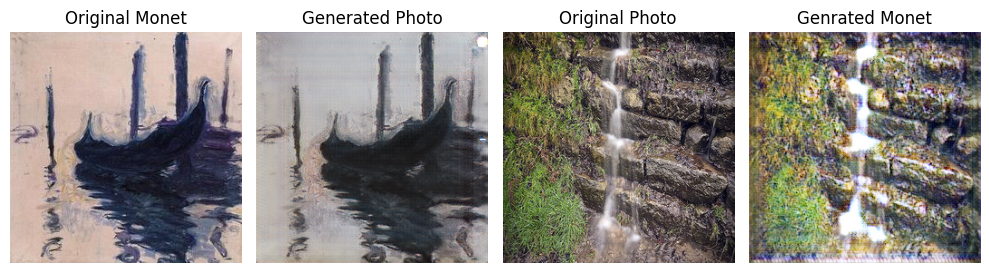

Epochs:  50%|█████████████████████████████████                                 | 20/40 [10:32:43<10:57:00, 1971.04s/it]

1/1 [==============================] - 0s 38ms/step


Epochs:  52%|██████████████████████████████████▋                               | 21/40 [11:07:03<10:32:40, 1997.92s/it]

Epoch 21/40
dA_loss_real: 0.052323816061488476, dA_loss_fake: 0.05408960549959948
dB_loss_real: 0.06777035216178691, dB_loss_fake: 0.056375042218685785
gen_loss1: 2.9842618717530076, gen_loss2: 3.189937352387542
1/1 [==============================] - 0s 33ms/step


Epochs:  55%|████████████████████████████████████▎                             | 22/40 [11:41:43<10:06:41, 2022.33s/it]

Epoch 22/40
dA_loss_real: 0.052242520127478514, dA_loss_fake: 0.054059556538836026
dB_loss_real: 0.06549905982495058, dB_loss_fake: 0.05429431306084497
gen_loss1: 2.97626210279405, gen_loss2: 3.119286460393655
1/1 [==============================] - 0s 31ms/step


Epochs:  57%|██████████████████████████████████████▌                            | 23/40 [12:19:14<9:52:29, 2091.12s/it]

Epoch 23/40
dA_loss_real: 0.04597008605059898, dA_loss_fake: 0.047705440394607584
dB_loss_real: 0.05987493460171609, dB_loss_fake: 0.050551078842256784
gen_loss1: 3.0870599170567345, gen_loss2: 3.2578601480028078
1/1 [==============================] - 0s 26ms/step


Epochs:  60%|████████████████████████████████████████▏                          | 24/40 [12:52:54<9:11:55, 2069.74s/it]

Epoch 24/40
dA_loss_real: 0.04455216962815941, dA_loss_fake: 0.04844706425261499
dB_loss_real: 0.05598070100727559, dB_loss_fake: 0.04716918401085696
gen_loss1: 3.054459635798269, gen_loss2: 3.189564486883876
1/1 [==============================] - 0s 25ms/step
Epoch 25/40
dA_loss_real: 0.04267603594463198, dA_loss_fake: 0.0452958255683486
dB_loss_real: 0.055439898822969895, dB_loss_fake: 0.04932769909496215
gen_loss1: 2.9952848801284344, gen_loss2: 3.2073235737008194
1/1 [==============================] - 0s 42ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


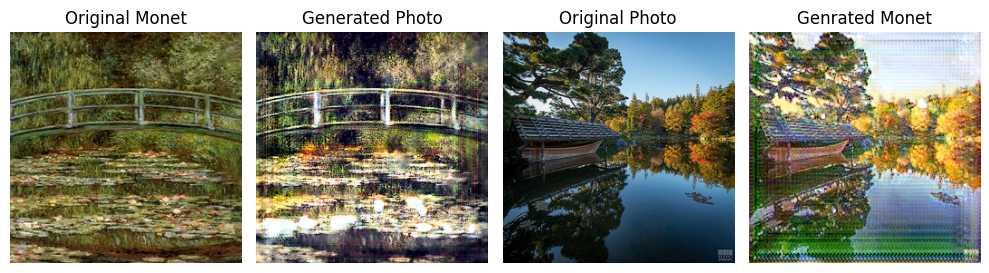

Epochs:  62%|█████████████████████████████████████████▉                         | 25/40 [13:26:43<8:34:20, 2057.38s/it]

1/1 [==============================] - 0s 33ms/step


Epochs:  65%|███████████████████████████████████████████▌                       | 26/40 [14:00:39<7:58:34, 2051.00s/it]

Epoch 26/40
dA_loss_real: 0.03914507966472073, dA_loss_fake: 0.04312227062792527
dB_loss_real: 0.05600551805178983, dB_loss_fake: 0.049366201752153206
gen_loss1: 3.005469643870575, gen_loss2: 3.2269473593518727
1/1 [==============================] - 0s 35ms/step


Epochs:  68%|█████████████████████████████████████████████▏                     | 27/40 [14:35:32<7:27:06, 2063.58s/it]

Epoch 27/40
dA_loss_real: 0.04164921173374781, dA_loss_fake: 0.045905528301110644
dB_loss_real: 0.054598943584565546, dB_loss_fake: 0.048393761669382813
gen_loss1: 2.9697274487302296, gen_loss2: 3.148367140760999
1/1 [==============================] - 0s 38ms/step


Epochs:  70%|██████████████████████████████████████████████▉                    | 28/40 [15:10:37<6:55:14, 2076.18s/it]

Epoch 28/40
dA_loss_real: 0.03527246188763179, dA_loss_fake: 0.039807921136721644
dB_loss_real: 0.048483307131406674, dB_loss_fake: 0.04462044606338175
gen_loss1: 3.0073411065252937, gen_loss2: 3.1935867870028183
1/1 [==============================] - 0s 41ms/step


Epochs:  72%|████████████████████████████████████████████████▌                  | 29/40 [15:48:57<6:32:55, 2143.20s/it]

Epoch 29/40
dA_loss_real: 0.04149133052763438, dA_loss_fake: 0.04584924096342697
dB_loss_real: 0.05284690711742543, dB_loss_fake: 0.046506089712969476
gen_loss1: 2.8977867333774525, gen_loss2: 3.0866627317380804
1/1 [==============================] - 0s 31ms/step
Epoch 30/40
dA_loss_real: 0.038939454233310807, dA_loss_fake: 0.04370978227155458
dB_loss_real: 0.050585835394624516, dB_loss_fake: 0.0448736952836985
gen_loss1: 2.953762660071347, gen_loss2: 3.1143133174900224
1/1 [==============================] - 0s 33ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


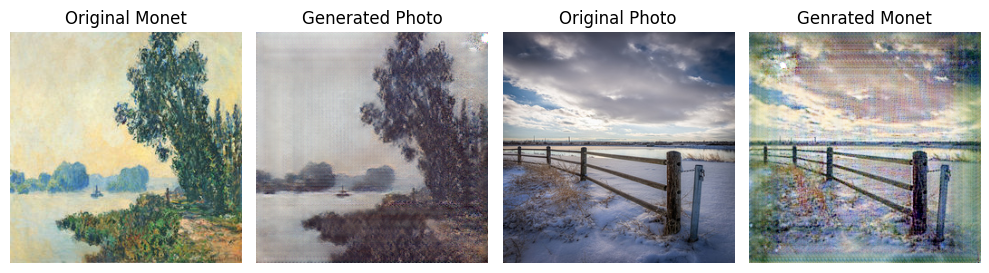

Epochs:  75%|██████████████████████████████████████████████████▎                | 30/40 [16:27:37<6:06:03, 2196.36s/it]

1/1 [==============================] - 0s 40ms/step


Epochs:  78%|███████████████████████████████████████████████████▉               | 31/40 [17:05:38<5:33:15, 2221.70s/it]

Epoch 31/40
dA_loss_real: 0.04055996966428689, dA_loss_fake: 0.04383254527125997
dB_loss_real: 0.05043713358791821, dB_loss_fake: 0.045323018048547735
gen_loss1: 2.859799025203092, gen_loss2: 3.0569761704054654
1/1 [==============================] - 0s 38ms/step


Epochs:  80%|█████████████████████████████████████████████████████▌             | 32/40 [17:44:06<4:59:40, 2247.61s/it]

Epoch 32/40
dA_loss_real: 0.03573872332314383, dA_loss_fake: 0.03974960125751389
dB_loss_real: 0.04964327525470449, dB_loss_fake: 0.04460984529851545
gen_loss1: 2.9266329258369255, gen_loss2: 3.1502513688889824
1/1 [==============================] - 0s 48ms/step


Epochs:  82%|███████████████████████████████████████████████████████▎           | 33/40 [18:22:20<4:23:49, 2261.38s/it]

Epoch 33/40
dA_loss_real: 0.03514739400891894, dA_loss_fake: 0.0397262613783398
dB_loss_real: 0.046091990113270025, dB_loss_fake: 0.0440638051049916
gen_loss1: 2.866258587244906, gen_loss2: 3.0918140202325173
1/1 [==============================] - 0s 27ms/step


Epochs:  85%|████████████████████████████████████████████████████████▉          | 34/40 [19:00:33<3:47:05, 2270.89s/it]

Epoch 34/40
dA_loss_real: 0.03415520582980008, dA_loss_fake: 0.039254421671310005
dB_loss_real: 0.04111178498569339, dB_loss_fake: 0.04090308606122
gen_loss1: 2.922588732770191, gen_loss2: 3.0739017761077165
1/1 [==============================] - 0s 50ms/step
Epoch 35/40
dA_loss_real: 0.03194175438910707, dA_loss_fake: 0.03724515136347847
dB_loss_real: 0.0398728797103605, dB_loss_fake: 0.03726948910496841
gen_loss1: 2.938705308078973, gen_loss2: 3.1182511234830965
1/1 [==============================] - 0s 44ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


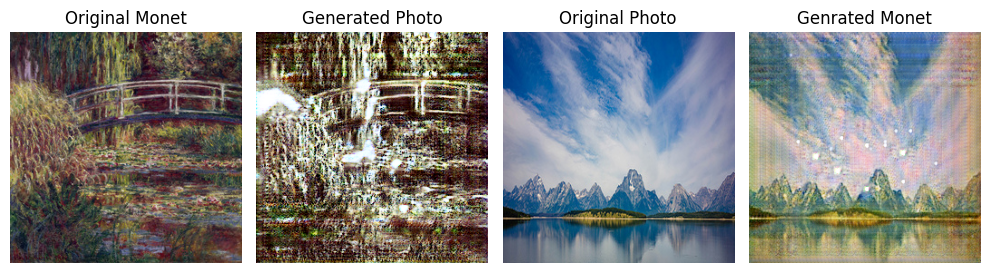

Epochs:  88%|██████████████████████████████████████████████████████████▋        | 35/40 [19:39:20<3:10:38, 2287.78s/it]

1/1 [==============================] - 0s 41ms/step


Epochs:  90%|████████████████████████████████████████████████████████████▎      | 36/40 [20:20:34<2:36:14, 2343.64s/it]

Epoch 36/40
dA_loss_real: 0.029301745718999305, dA_loss_fake: 0.03534157854497106
dB_loss_real: 0.03830493884457621, dB_loss_fake: 0.035764858373081104
gen_loss1: 2.9715592385831604, gen_loss2: 3.162289060854464
1/1 [==============================] - 0s 63ms/step


Epochs:  92%|█████████████████████████████████████████████████████████████▉     | 37/40 [21:01:53<1:59:12, 2384.27s/it]

Epoch 37/40
dA_loss_real: 0.028239261898764318, dA_loss_fake: 0.0332172395462668
dB_loss_real: 0.038355440401767686, dB_loss_fake: 0.03492832972910177
gen_loss1: 2.9411424216746287, gen_loss2: 3.1510094426618984
1/1 [==============================] - 0s 46ms/step


Epochs:  95%|███████████████████████████████████████████████████████████████▋   | 38/40 [21:42:43<1:20:07, 2403.99s/it]

Epoch 38/40
dA_loss_real: 0.026710351909139427, dA_loss_fake: 0.030930159581652093
dB_loss_real: 0.0367269119087875, dB_loss_fake: 0.036304247162367034
gen_loss1: 2.9378969095693996, gen_loss2: 3.137991293487071
1/1 [==============================] - 0s 43ms/step


Epochs:  98%|███████████████████████████████████████████████████████████████████▎ | 39/40 [22:23:36<40:18, 2418.63s/it]

Epoch 39/40
dA_loss_real: 0.024930364404180883, dA_loss_fake: 0.030313207573473205
dB_loss_real: 0.03456502860034806, dB_loss_fake: 0.034951909944426755
gen_loss1: 2.8978999968859247, gen_loss2: 3.1136908226321784
1/1 [==============================] - 0s 50ms/step
Epoch 40/40
dA_loss_real: 0.025300329102087564, dA_loss_fake: 0.029412257074357042
dB_loss_real: 0.0357056600299308, dB_loss_fake: 0.03484892979821303
gen_loss1: 2.9053146387440676, gen_loss2: 3.1400506230137295
1/1 [==============================] - 0s 42ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


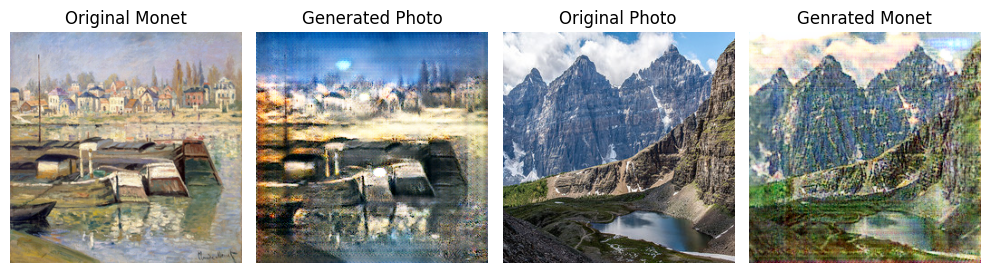

Epochs: 100%|█████████████████████████████████████████████████████████████████████| 40/40 [23:04:54<00:00, 2077.35s/it]


In [21]:
train(d_A, d_B, g_AB, g_BA, c_AB, c_BA, epochs=40, chunk=5)

In [22]:
g_AB.save("GeneratorMtoP2_40.h5")
g_BA.save("GeneratorPtoM2_40.h5")

In [33]:
HtoZ_gen = load_model("C:/Users/IT/midas/GeneratorMtoP2_40.h5")
ZtoH_gen = load_model("C:/Users/IT/midas/GeneratorPtoM2_40.h5")

1/1 [==============================] - 0s 47ms/step


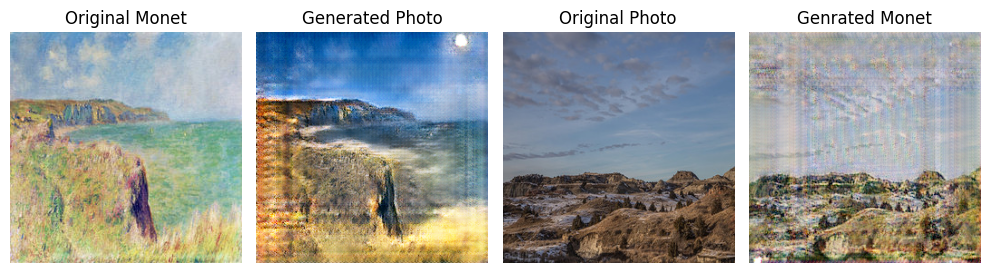

1/1 [==============================] - 0s 43ms/step


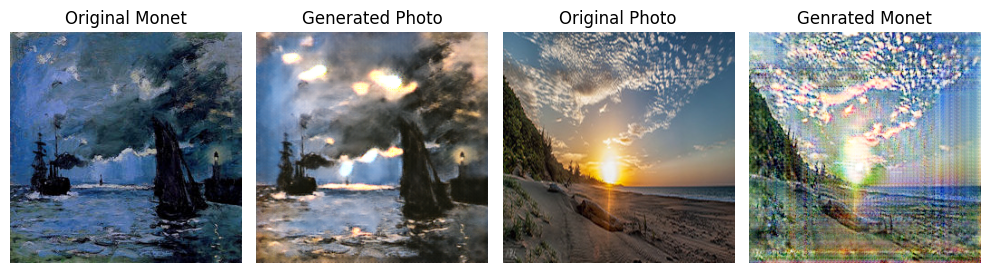

1/1 [==============================] - 0s 29ms/step


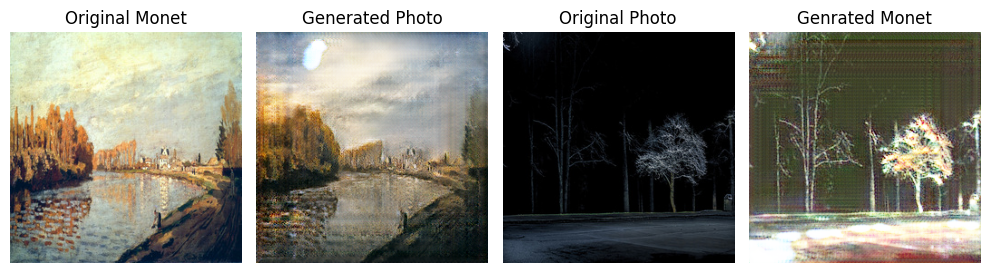

1/1 [==============================] - 0s 32ms/step


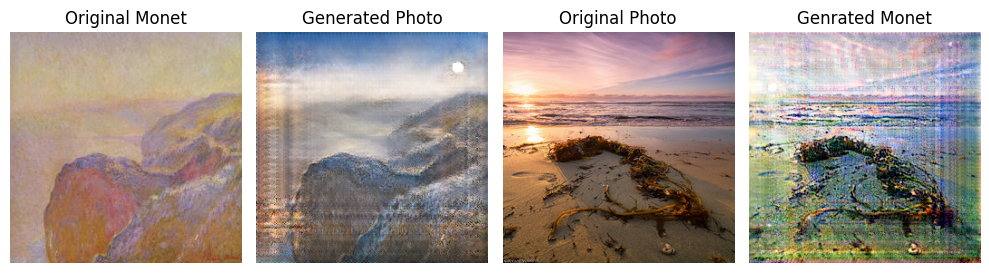

1/1 [==============================] - 0s 33ms/step


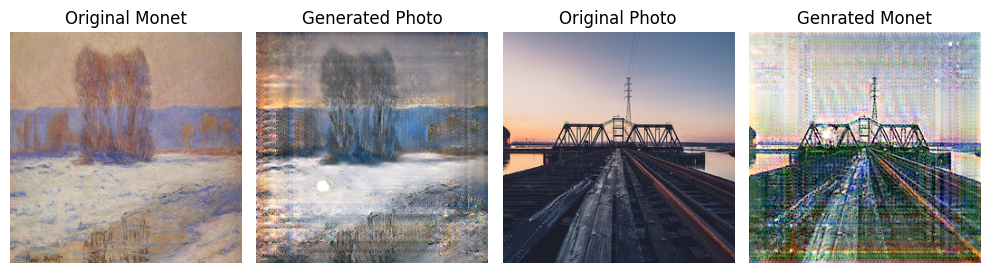

In [40]:
show_preds(HtoZ_gen, ZtoH_gen, n_images=5)

In [41]:
HtoZ_gen_25 = load_model("C:/Users/IT/midas/GeneratorMtoP_40.h5")
ZtoH_gen_25 = load_model("C:/Users/IT/midas/GeneratorPtoM_40.h5")

1/1 [==============================] - 0s 30ms/step


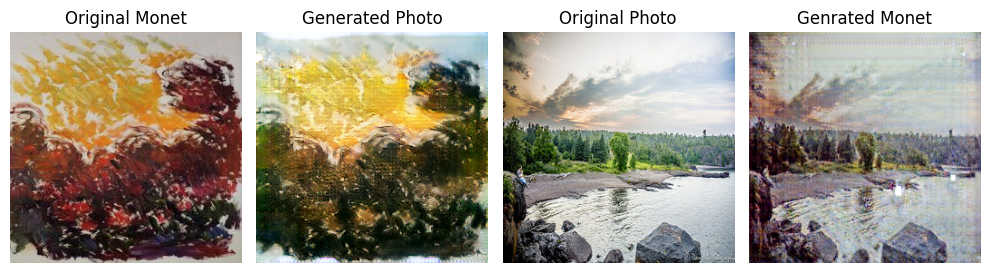

1/1 [==============================] - 0s 48ms/step


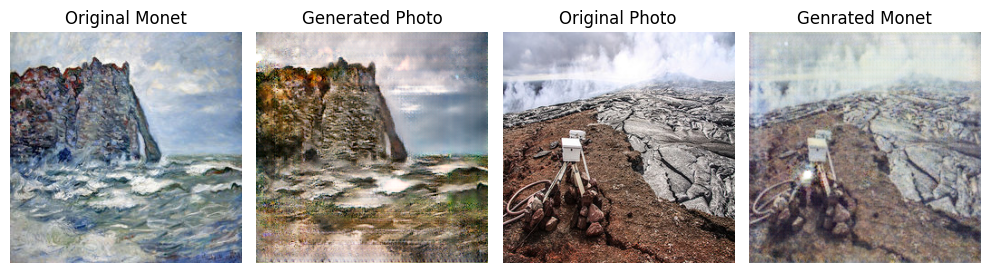

1/1 [==============================] - 0s 37ms/step


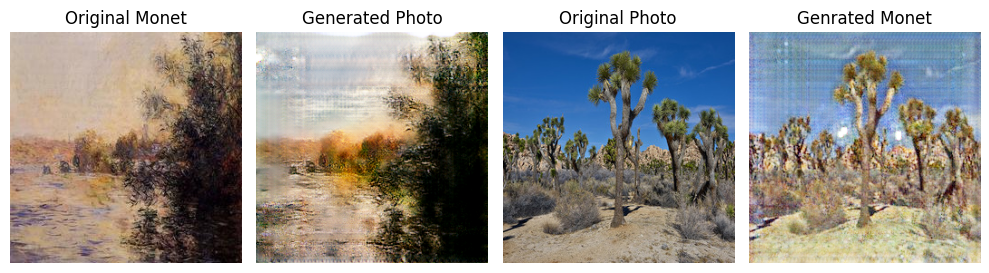

1/1 [==============================] - 0s 39ms/step


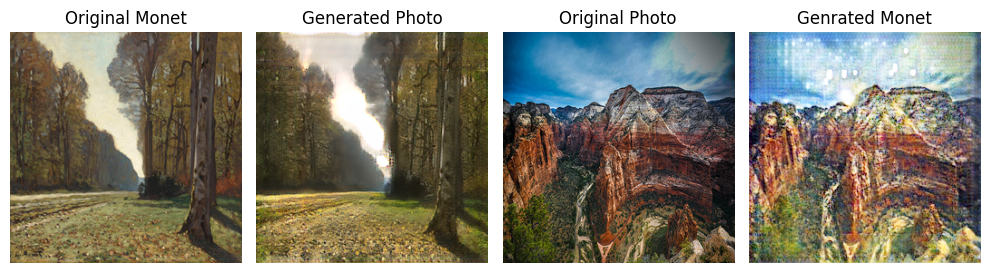

1/1 [==============================] - 0s 38ms/step


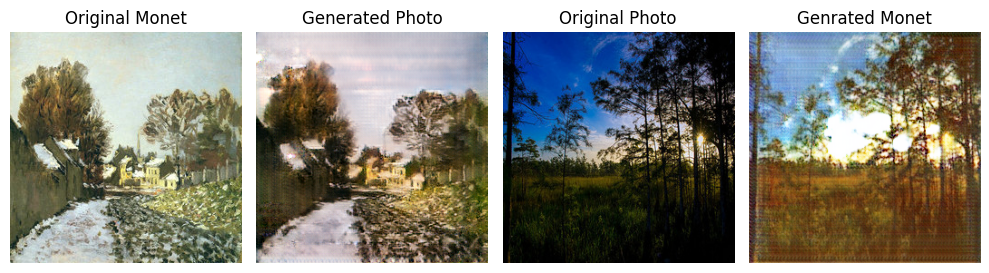

In [43]:
show_preds(HtoZ_gen_25, ZtoH_gen_25, n_images=5)